# Object Detection for Autonomous Driving with YOLOv2

This notebook demonstrates real-time object detection on road images using a pre-trained **YOLOv2** model, originally developed by [Redmon et al.](https://arxiv.org/abs/1506.02640). YOLO ("You Only Look Once") detects cars, pedestrians, and other objects by predicting bounding boxes and class probabilities in a **single forward pass**.

The dataset consists of road scenes captured from a vehicle-mounted camera. YOLOv2 outputs bounding boxes and class scores, which are refined using **confidence thresholding** and **non-maximum suppression (NMS)** to reduce redundant or overlapping predictions.


## How YOLOv2 Works

YOLO divides each input image into a grid and predicts bounding boxes and class probabilities for each cell.

- **Input**: RGB image resized to 608×608  
- **Output**: Tensor of shape (19, 19, 5, 85), representing:
  - 5 anchor boxes per grid cell  
  - For each box:
    - Object confidence score `p_c`
    - Bounding box coordinates `(b_x, b_y, b_h, b_w)`
    - 80 class probabilities

This results in **19 × 19 × 5 = 1,805 candidate boxes per image**.

To extract meaningful detections, we apply:

- **Score Filtering**: Discard low-confidence boxes  
- **Non-Max Suppression (NMS)**: Eliminate overlapping boxes predicting the same object


## Core Concepts

**Intersection over Union (IoU)** and **Non-Max Suppression (NMS)** are critical for accurate object detection:

- **IoU**:  
  $
  IoU = \frac{\text{Area of Overlap}}{\text{Area of Union}}
  $
  Measures how much two boxes overlap.

- **NMS**:  
  For each class, retain only the box with the highest confidence if overlapping boxes exceed an IoU threshold.

These steps reduce false positives and improve detection precision.


## Detection Pipeline

1. **Load YOLOv2** with pre-trained weights
2. **Preprocess image** (resize and normalize)
3. **Run inference** to get raw box predictions
4. **Filter results** using confidence scores and NMS
5. **Draw final bounding boxes** with class labels and scores

## Prediction Example

The `predict_on_image()` function wraps the full pipeline:

- Accepts an input image path
- Preprocesses the image
- Runs YOLOv2 inference
- Applies score filtering and NMS
- Draws bounding boxes on the original image

In [2]:
import os 
import sys
# point to root directory of the repo
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(project_root)

2025-04-30 21:57:10.055756: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


/Users/matthewgraham/anaconda3/envs/google_ml_env/lib/python3.8/site-packages/keras/src/layers/core/lambda_layer.py:327: UserWarning: yad2k.models.keras_yolo is not loaded, but a Lambda layer uses it. It may cause errors.
  function = cls._parse_function_from_config(


Detected 10 objects in test.jpg
car 0.89 (366, 299) (745, 648)
car 0.80 (762, 282) (942, 412)
car 0.75 (159, 303) (346, 440)
car 0.70 (947, 324) (1280, 704)
car 0.68 (705, 279) (786, 351)
bus 0.67 (5, 267) (220, 407)
car 0.60 (925, 285) (1045, 374)
car 0.45 (336, 296) (377, 335)
car 0.38 (965, 273) (1023, 292)
traffic light 0.35 (681, 195) (692, 215)


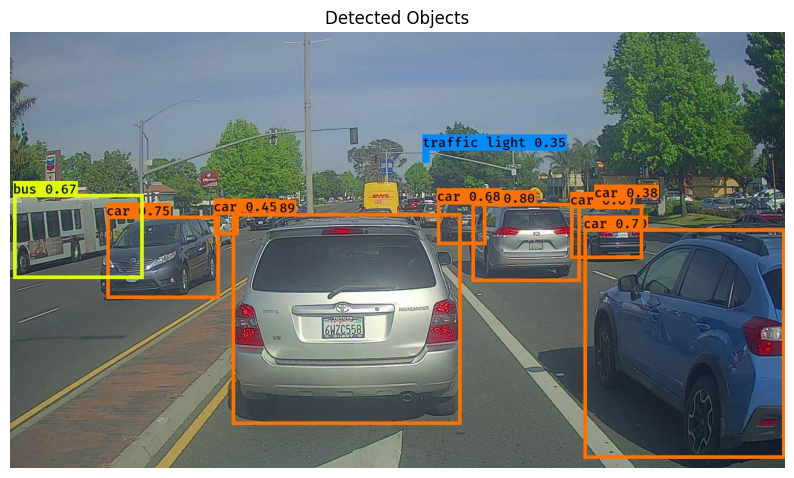

In [3]:
from src.detection.model_loader import load_yolo_model, load_config
from src.detection.predict import predict_on_image

# load everything
yolo_model = load_yolo_model()
class_names, anchors = load_config()

# predict on one image
out_scores, out_boxes, out_classes, output_path = predict_on_image(yolo_model, "../data/detection/sample_images/test.jpg", anchors, class_names)

Run detection over all test images in a folder


/Users/matthewgraham/anaconda3/envs/google_ml_env/lib/python3.8/site-packages/keras/src/layers/core/lambda_layer.py:327: UserWarning: yad2k.models.keras_yolo is not loaded, but a Lambda layer uses it. It may cause errors.
  function = cls._parse_function_from_config(


Detected 10 objects in 0081.jpg
car 0.79 (25, 328) (141, 398)
car 0.77 (612, 293) (722, 353)
car 0.68 (187, 309) (301, 381)
traffic light 0.59 (536, 66) (572, 111)
traffic light 0.58 (379, 93) (407, 147)
car 0.54 (354, 291) (449, 374)
car 0.46 (0, 318) (30, 469)
traffic light 0.45 (381, 97) (447, 163)
traffic light 0.44 (810, 180) (840, 222)
car 0.38 (573, 285) (602, 305)


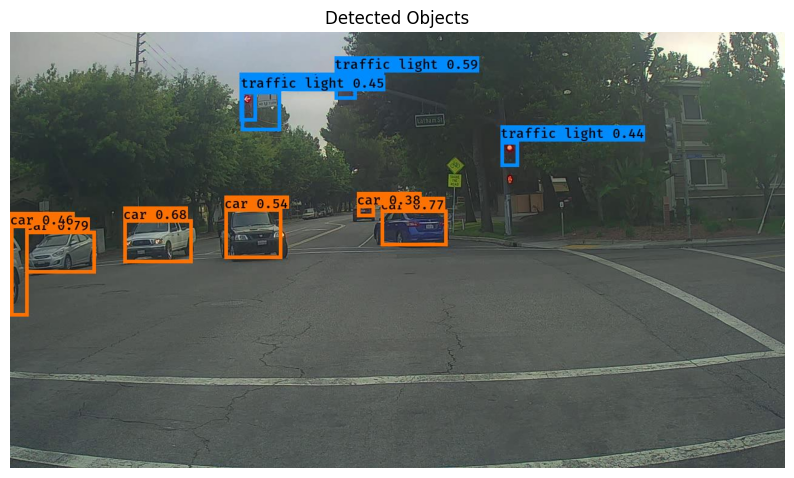

Detected 9 objects in 0077.jpg
car 0.75 (150, 314) (245, 374)
car 0.71 (368, 292) (450, 357)
car 0.70 (243, 295) (345, 368)
traffic light 0.60 (380, 92) (408, 148)
traffic light 0.60 (536, 65) (571, 112)
traffic light 0.47 (810, 180) (839, 222)
traffic light 0.41 (382, 96) (446, 161)
car 0.40 (493, 288) (528, 307)
car 0.32 (339, 303) (376, 343)


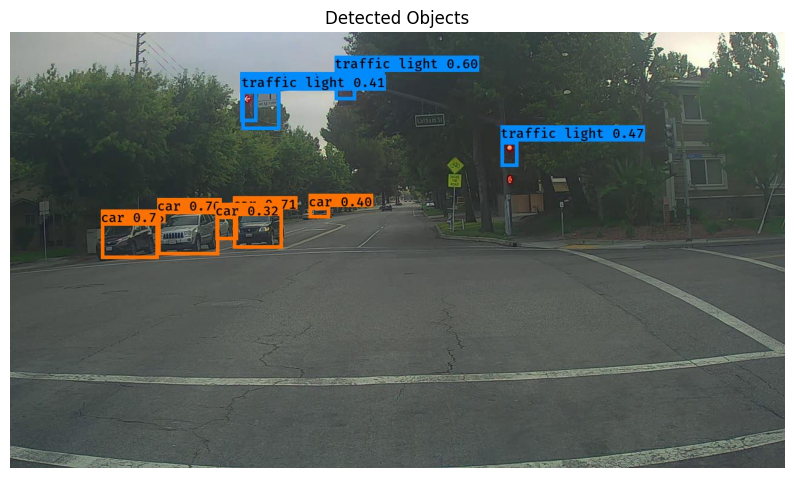

Detected 2 objects in 0014.jpg
truck 0.65 (716, 274) (1056, 385)
traffic light 0.42 (226, 183) (245, 211)


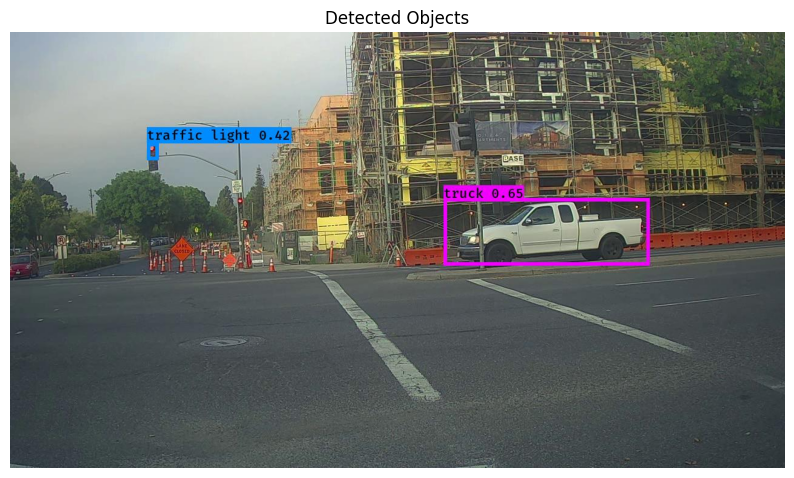

Detected 4 objects in 0088.jpg
traffic light 0.62 (378, 91) (406, 151)
traffic light 0.53 (536, 75) (567, 119)
traffic light 0.41 (384, 96) (449, 163)
traffic light 0.41 (812, 198) (832, 230)


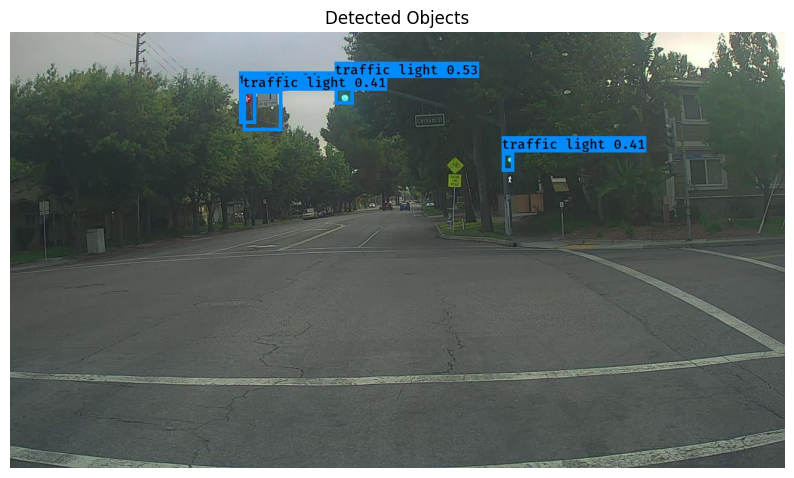

Detected 9 objects in 0074.jpg
car 0.87 (31, 319) (424, 485)
car 0.62 (365, 294) (450, 346)
traffic light 0.60 (380, 91) (407, 147)
traffic light 0.59 (536, 66) (572, 112)
car 0.52 (284, 298) (369, 338)
traffic light 0.49 (810, 179) (839, 223)
car 0.42 (134, 309) (233, 359)
traffic light 0.40 (383, 95) (447, 162)
car 0.33 (486, 287) (522, 309)


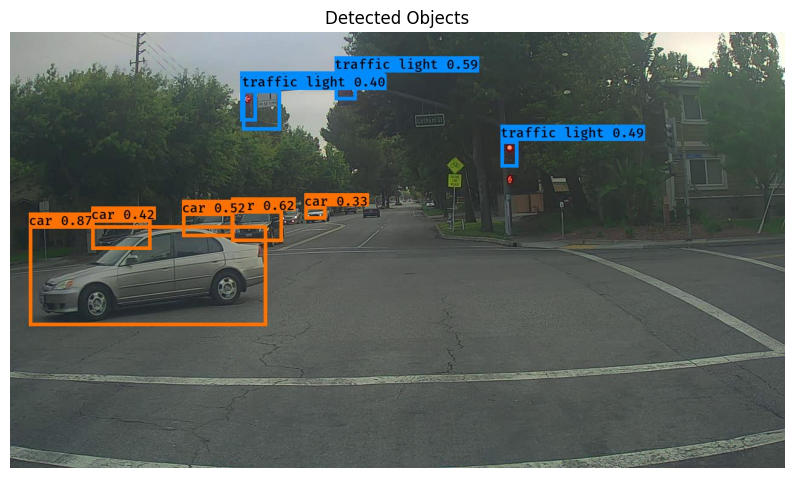

Detected 3 objects in 0015.jpg
truck 0.72 (714, 275) (1086, 387)
traffic light 0.45 (739, 142) (776, 196)
traffic light 0.44 (219, 184) (242, 218)


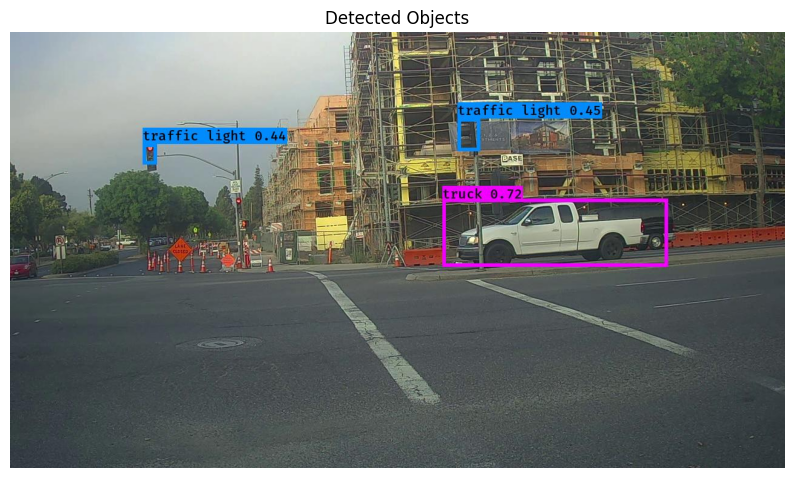

Detected 5 objects in 0089.jpg
traffic light 0.58 (541, 81) (572, 131)
traffic light 0.56 (379, 112) (405, 157)
traffic light 0.37 (818, 209) (841, 239)
car 0.34 (487, 308) (516, 324)
traffic light 0.31 (818, 224) (840, 255)


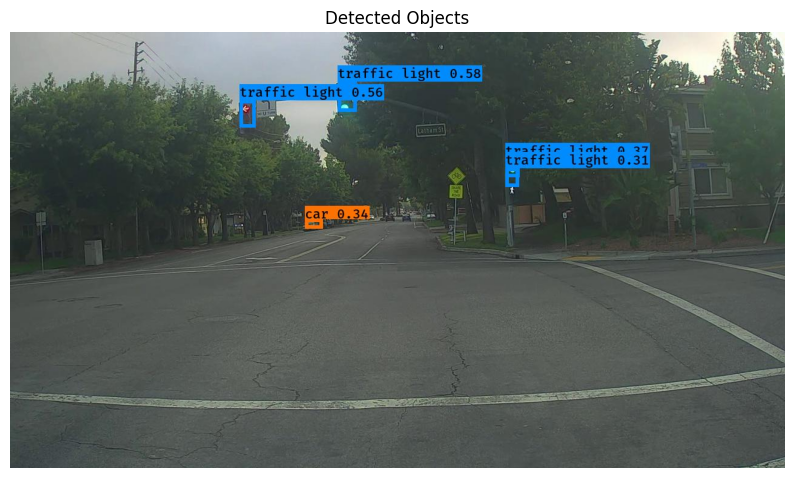

Detected 6 objects in 0053.jpg
car 0.50 (725, 293) (814, 355)
pottedplant 0.50 (1214, 238) (1277, 354)
pottedplant 0.40 (1069, 275) (1125, 348)
pottedplant 0.39 (1068, 295) (1105, 346)
car 0.37 (697, 295) (734, 325)
fire hydrant 0.33 (1112, 360) (1163, 458)


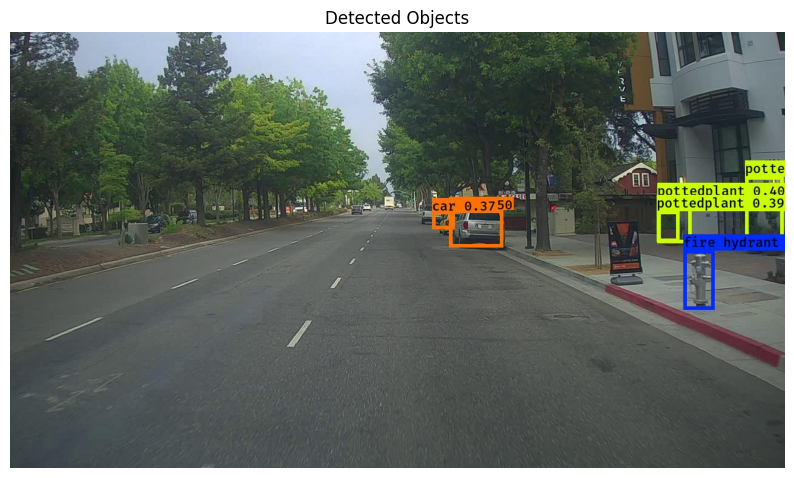

Detected 6 objects in 0030.jpg
truck 0.58 (718, 273) (831, 362)
car 0.52 (439, 307) (482, 334)
car 0.47 (117, 336) (171, 359)
car 0.38 (194, 314) (309, 407)
car 0.36 (540, 298) (570, 316)
car 0.35 (492, 299) (529, 325)


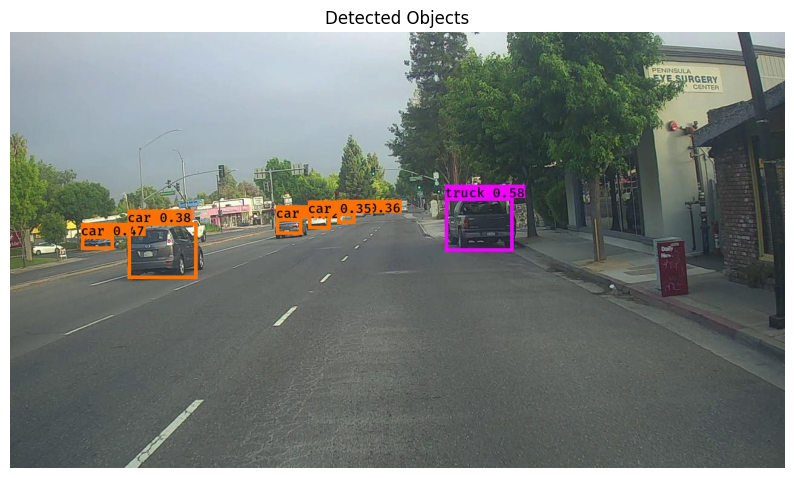

Detected 1 objects in 0049.jpg
car 0.41 (869, 285) (917, 307)


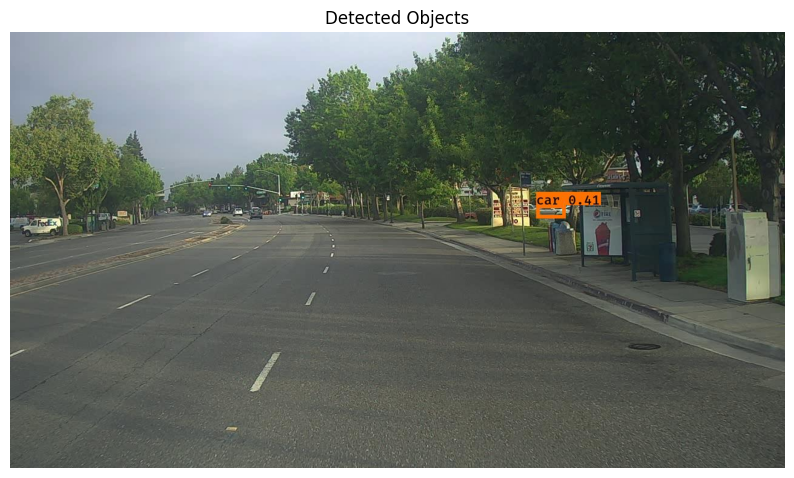

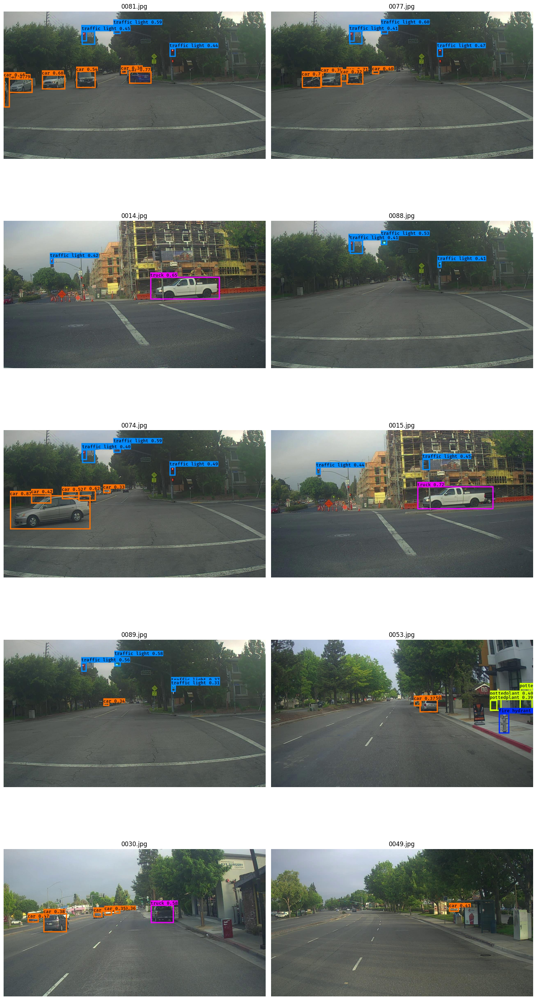

In [4]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
from src.detection.predict import predict_on_image
from src.detection.model_loader import load_yolo_model, load_config

# Load model and config
yolo_model = load_yolo_model()
class_names, anchors = load_config()

# Directory containing sample images
image_dir = "../data/detection/sample_images"
image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.lower().endswith((".jpg", ".png"))]

# Select 10 random images
sample_images = random.sample(image_paths, k=min(10, len(image_paths)))

# Run detection and store output paths
output_paths = []
for image_path in sample_images:
    _, _, _, output_path = predict_on_image(yolo_model, image_path, anchors, class_names)
    output_paths.append(output_path)

# Plot in a 2-column grid
n_images = len(output_paths)
n_cols = 2
n_rows = (n_images + 1) // n_cols

plt.figure(figsize=(15, n_rows * 6))
for i, path in enumerate(output_paths):
    img = Image.open(path)
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis("off")
plt.tight_layout()
plt.show()

🎥 Detect objects frame-by-frame in a video using OpenCV



In [ ]:
import cv2
import os
from src.detection.model_loader import load_yolo_model, load_config
from src.detection.predict import predict_on_frame

# load YOLO model and config
yolo_model = load_yolo_model()
class_names, anchors = load_config()

# input & output paths
video_path = "/Users/matthewgraham/Downloads/autonomous-driving-vision/assets/detection_media/road_video.mp4"
output_path = "/Users/matthewgraham/Downloads/autonomous-driving-vision/assets/detection_media/road_video_output.mp4"

# open video file
cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

# define video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # detect and draw boxes
    output_frame = predict_on_frame(yolo_model, frame, anchors, class_names)

    # write frame to output video
    out.write(output_frame)

    frame_count += 1
    if frame_count % 10 == 0:
        print(f"Processed {frame_count} frames...")

cap.release()
out.release()
print(f"Saved video to {output_path}")

### YOLOv2 Detection on Road Video

<video width="700" height="400" controls>
  <source src="../assets/detection_media/road_video_output_h264.mp4" type="video/mp4">
  Your browser does not support the video tag.
</video>

# Improvements to add
1. fix colors for classes
1. add webcam support for real-time detection
2. add a dashboard to display counts of detected object classes per image
3. add benchmarking to measure inference speed